In [ ]:
print("Hi guys!")

Hi guys!


In [ ]:
!git clone https://github.com/fenago/cv2

Cloning into 'cv2'...
remote: Enumerating objects: 380, done.
remote: Counting objects: 100% (69/69), done.
remote: Compressing objects: 100% (55/55), done.
remote: Total 380 (delta 39), reused 13 (delta 13), pack-reused 311 (from 2)
Receiving objects: 100% (380/380), 163.13 MiB | 31.00 MiB/s, done.
Resolving deltas: 100% (58/58), done.
Updating files: 100% (257/257), done.


In [ ]:
import cv2
import numpy as np

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

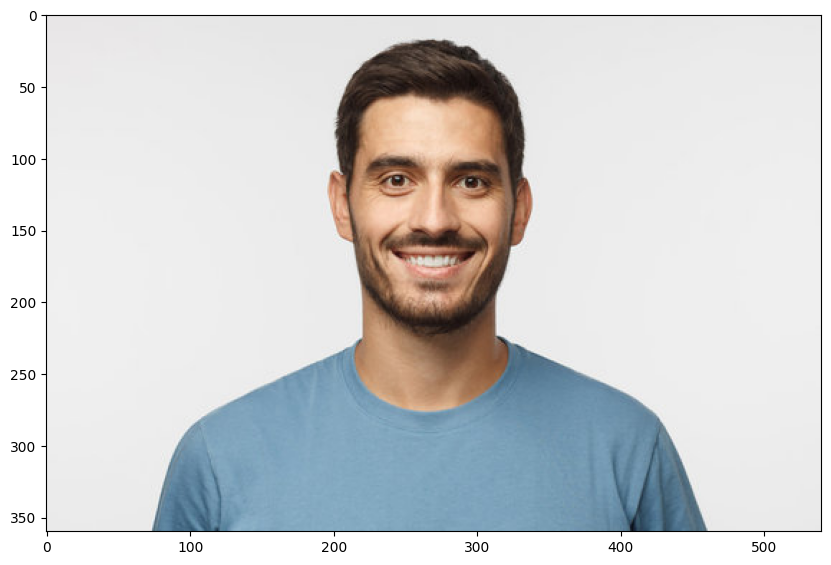

In [ ]:
# Read the input image
img1 = cv2.imread('/content/cv2/Mod14/visuals/c0-m14-NB-img1.jpg', cv2.IMREAD_COLOR)
plt.figure(figsize=(10,10))
plt.imshow(img1[:,:,::-1]);

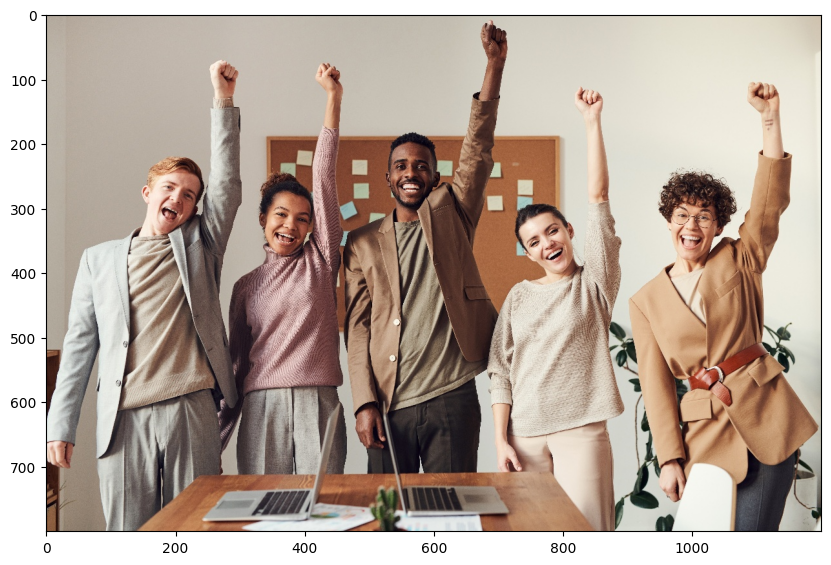

In [ ]:
img2 = cv2.imread('/content/cv2/Mod14/visuals/c0-m14-NB-img2.jpg', cv2.IMREAD_COLOR)
plt.figure(figsize=(10,10))
plt.imshow(img2[:,:,::-1]);

In [ ]:
# Function for rectangular blur with dnn
def detect(frame, net, scale, mean, in_width, in_height):
    h = frame.shape[0]
    w = frame.shape[1]
   # Convert the image into a blob format.
    blob = cv2.dnn.blobFromImage(frame, scalefactor=scale,
                                 size=(in_width, in_height), mean=mean, swapRB=False, crop=False)
    # Pass the blob to the DNN model.
    net.setInput(blob)
    # Retrieve detections from the DNN model.
    detections = net.forward()

    # Process each detection.
    for i in range(detections.shape[2]):
        confidence = detections[0, 0, i, 2]
        if confidence > detection_threshold:

            # Extract the bounding box coordinates from the detection.
            box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
            (x1, y1, x2, y2) = box.astype('int')

            # Annotate the video frame with the detection results.
            cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 2)
            label = 'Confidence: %.4f' % confidence
            label_size, base_line = cv2.getTextSize(label, font_style, font_scale, font_thickness)
            cv2.rectangle(frame, (x1, y1 - label_size[1]), (x1 + label_size[0], y1 + base_line),
                          (255, 255, 255), cv2.FILLED)
            cv2.putText(frame, label, (x1, y1), font_style, font_scale, (0, 0, 0))
    return frame

In [ ]:
net = cv2.dnn.readNetFromCaffe('/content/cv2/Mod14/model/deploy.prototxt',
                               '/content/cv2/Mod14/model/res10_300x300_ssd_iter_140000.caffemodel')

In [ ]:
# Model parameters used to train model.
mean = [104, 117, 123]
scale = 1.0
in_width = 300
in_height = 300

In [ ]:
# Set the detection threshold for face detections.
detection_threshold = 0.5

# Annotation settings.
font_style = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 0.5
font_thickness = 1

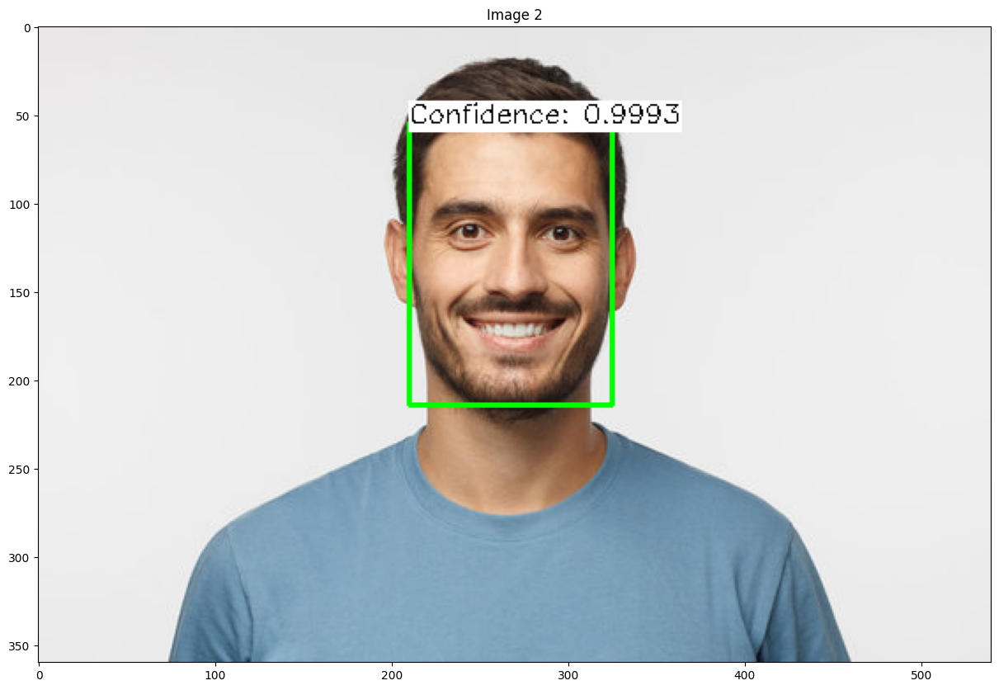

In [ ]:
op1 = detect(img1, net, scale, mean, in_width, in_height)

plt.figure(figsize = [15,10])
plt.imshow(op1[:,:,::-1])
plt.title("Image 2");

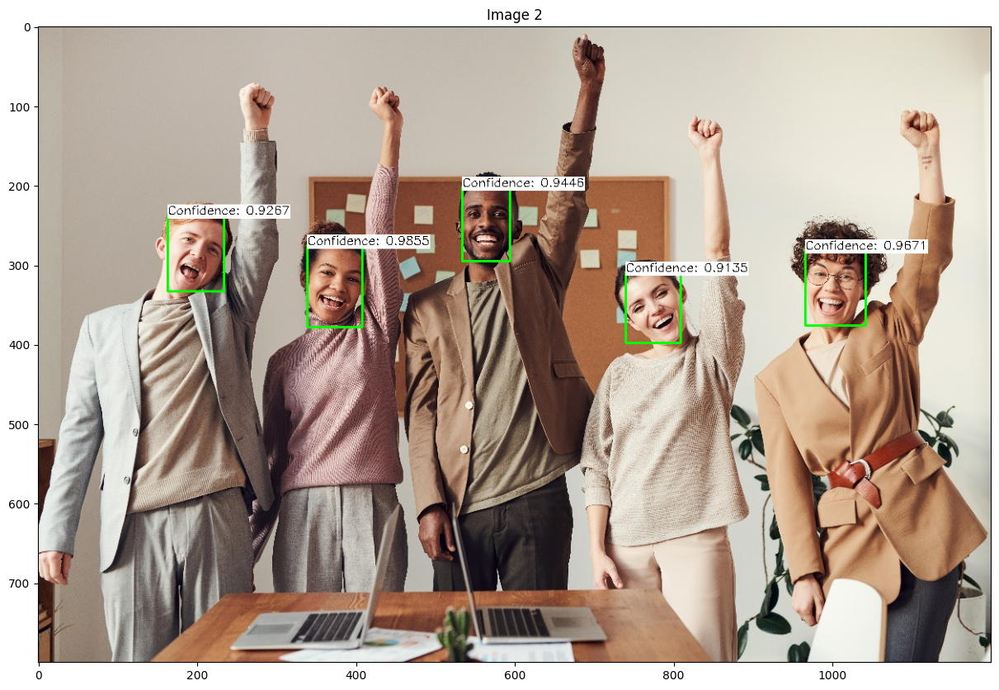

In [ ]:
op2 = detect(img2, net, scale, mean, in_width, in_height)

plt.figure(figsize = [15,10])
plt.imshow(op2[:,:,::-1])
plt.title("Image 2");

# Part 2:  Privacy


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
%matplotlib inline
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 14

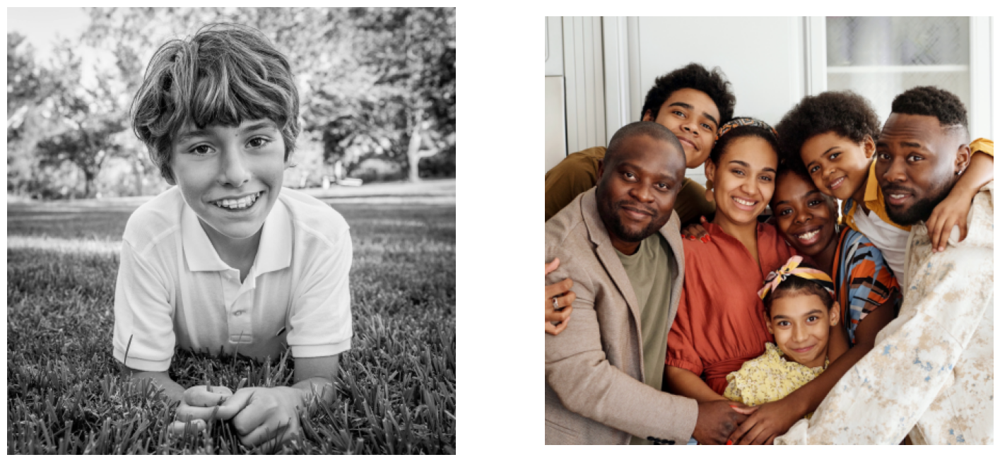

In [ ]:
img1 = cv2.imread('/content/cv2/Mod14/Applications/boy.jpg', cv2.IMREAD_COLOR)
img2 = cv2.imread('/content/cv2/Mod14/Applications/family.jpg', cv2.IMREAD_COLOR)

fig = plt.figure(figsize=(18,10))

plt.subplot(1,2,1); plt.axis('off'); plt.imshow(img1[:,:,::-1])
plt.subplot(1,2,2); plt.axis('off'); plt.imshow(img2[:,:,::-1]);

In [ ]:
modelFile = '/content/cv2/Mod14/model/res10_300x300_ssd_iter_140000.caffemodel'
configFile = '/content/cv2/Mod14/model/deploy.prototxt'

net = cv2.dnn.readNetFromCaffe(prototxt=configFile, caffeModel=modelFile)

In [ ]:
def blur(face, factor=3):

    h, w  = face.shape[:2]

    if factor < 1: factor = 1 # Maximum blurring
    if factor > 5: factor = 5 # Minimal blurring

    # Kernel size.
    w_k = int(w/factor)
    h_k = int(h/factor)

    # Insure kernel is an odd number.
    if w_k%2 == 0: w_k += 1
    if h_k%2 == 0: h_k += 1

    blurred = cv2.GaussianBlur(face, (int(w_k), int(h_k)), 0, 0)
    return blurred

In [ ]:
def face_blur_rect(image, net, factor=3, detection_threshold=0.9):

    img = image.copy()

    # Convert the image into a blob format.
    blob = cv2.dnn.blobFromImage(img, scalefactor=1.0, size=(300,300), mean=[104, 117, 123])

    # Pass the blob to the DNN model.
    net.setInput(blob)

    # Retrieve detections from the DNN model.
    detections = net.forward()

    (h, w) = img.shape[:2]

    # Process the detetcions.
    for i in range(detections.shape[2]):
        confidence = detections[0, 0, i, 2]
        if confidence > detection_threshold:

            # Extract the bounding box coordinates from the detection.
            box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
            (x1, y1, x2, y2) = box.astype("int")

            # Extract the face ROI.
            face = img[y1:y2, x1:x2]

            face = blur(face, factor=factor)

            # Replace the detected face with the blurred one.
            img[y1:y2, x1:x2] = face

    return img

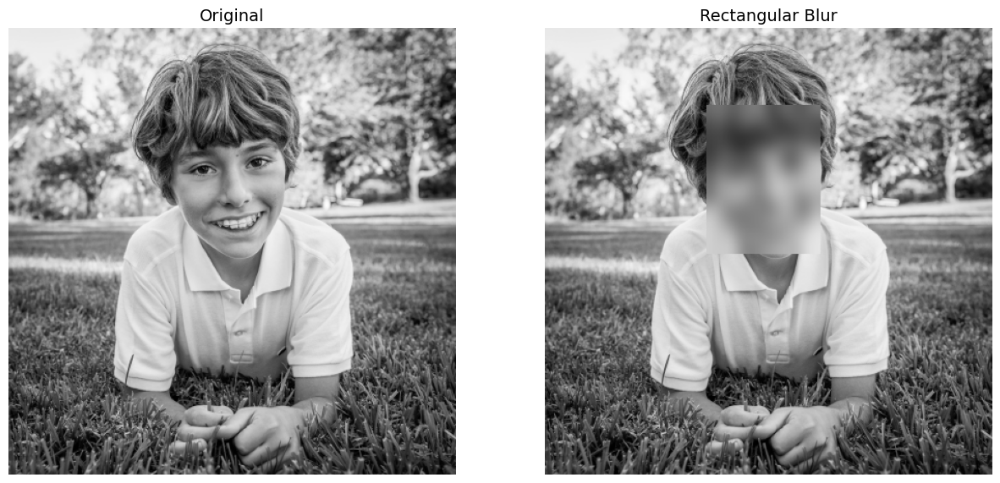

In [ ]:
img1_rect = face_blur_rect(img1, net, factor=2.5)

fig = plt.figure(figsize=(15,10))
plt.subplot(1,2,1); plt.axis('off'); plt.imshow(img1[:,:,::-1]);      plt.title('Original')
plt.subplot(1,2,2); plt.axis('off'); plt.imshow(img1_rect[:,:,::-1]); plt.title('Rectangular Blur');

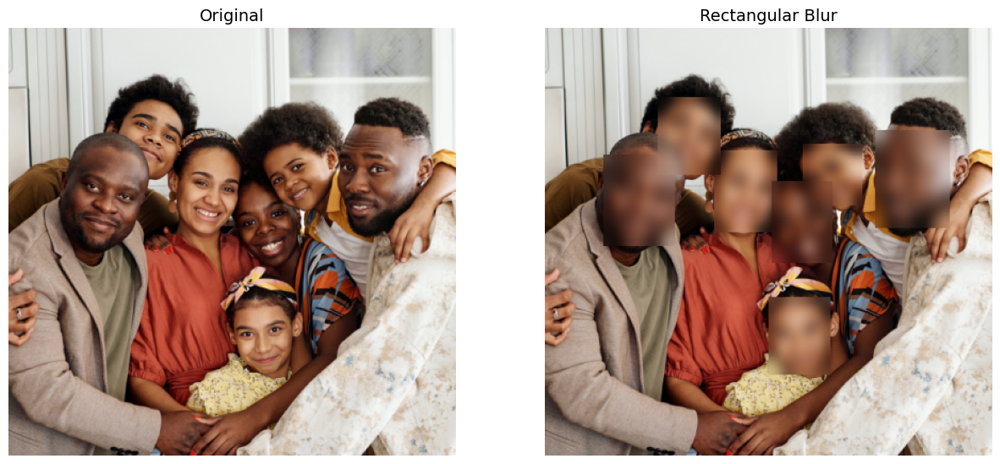

In [ ]:
img2_rect = face_blur_rect(img2, net, factor=2)

fig = plt.figure(figsize=(15,10))
plt.subplot(1,2,1); plt.axis('off'); plt.imshow(img2[:,:,::-1]);      plt.title('Original')
plt.subplot(1,2,2); plt.axis('off'); plt.imshow(img2_rect[:,:,::-1]); plt.title('Rectangular Blur');

In [ ]:
def face_blur_ellipse(image, net, factor=3, detect_threshold=0.90, write_mask=False):

    img = image.copy()
    img_blur = img.copy()

    elliptical_mask = np.zeros(img.shape, dtype=img.dtype)

    # Prepare image and perform inference.
    blob = cv2.dnn.blobFromImage(img, scalefactor=1.0, size=(300,300), mean=[104, 117, 123])
    net.setInput(blob)
    detections = net.forward()

    h, w = img.shape[:2]
    for i in range(detections.shape[2]):
        confidence = detections[0, 0, i, 2]
        if confidence > detect_threshold:

            # Extract the bounding box coordinates from the detection.
            box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
            (x1, y1, x2, y2) = box

            # The face is defined by the bounding rectangle from the detection.
            face = img[int(y1):int(y2), int(x1):int(x2), :]

            # Blur the rectangular area defined by the bounding box.
            face = blur(face, factor=factor)

            # Copy the `blurred_face` to the blurred image.
            img_blur[int(y1):int(y2), int(x1):int(x2), :] = face

            # Specify the elliptical parameters directly from the bounding box coordinates.
            e_center = (x1 + (x2 - x1)/2, y1 + (y2 - y1)/2)
            e_size   = (x2 - x1, y2 - y1)
            e_angle  = 0.0

            # Create an elliptical mask.
            elliptical_mask = cv2.ellipse(elliptical_mask, (e_center, e_size, e_angle),
                                                      (255, 255, 255), -1, cv2.LINE_AA)
            # Apply the elliptical mask
            np.putmask(img, elliptical_mask, img_blur)

    if write_mask:
        cv2.imwrite('elliptical_mask.jpg', elliptical_mask)

    return img

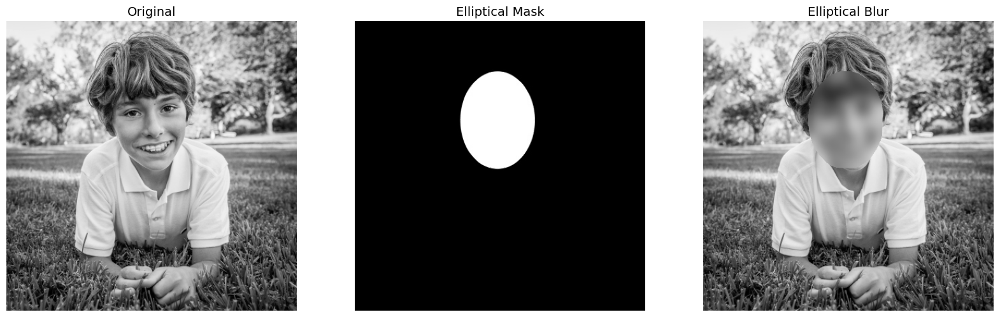

In [ ]:
img1_ellipse = face_blur_ellipse(img1, net, factor=2.5, write_mask=True)

mask = cv2.imread('elliptical_mask.jpg')
fig = plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.axis('off'); plt.imshow(img1[:,:,::-1]);         plt.title('Original')
plt.subplot(1,3,2); plt.axis('off'); plt.imshow(mask);                   plt.title('Elliptical Mask')
plt.subplot(1,3,3); plt.axis('off'); plt.imshow(img1_ellipse[:,:,::-1]); plt.title('Elliptical Blur');

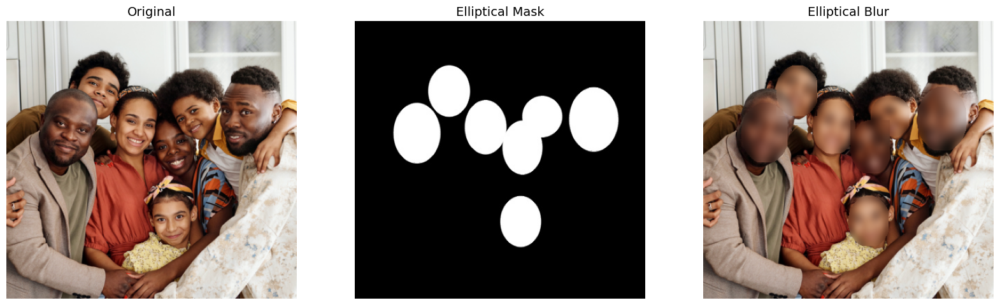

In [ ]:
img2_ellipse = face_blur_ellipse(img2, net, factor=2, write_mask=True)

mask = cv2.imread('elliptical_mask.jpg')
fig = plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.axis('off'); plt.imshow(img2[:,:,::-1]);         plt.title('Original')
plt.subplot(1,3,2); plt.axis('off'); plt.imshow(mask);                   plt.title('Elliptical Mask')
plt.subplot(1,3,3); plt.axis('off'); plt.imshow(img2_ellipse[:,:,::-1]); plt.title('Elliptical Blur');

In [ ]:
def pixelate(roi, pixels=16):

    # Size of region to pixelate.
    roi_h, roi_w = roi.shape[:2]

    if roi_h > pixels and roi_w > pixels:
        # Resize input ROI to the (small) pixelated size.
        roi_small = cv2.resize(roi, (pixels, pixels), interpolation=cv2.INTER_LINEAR)

        # Now enlarge the pixelated ROI to fill the size of the original ROI.
        roi_pixelated = cv2.resize(roi_small, (roi_w, roi_h), interpolation=cv2.INTER_NEAREST)
    else:
        roi_pixelated = roi

    return roi_pixelated

In [ ]:
def face_blur_pixelate(image, net, detection_threshold=0.9, pixels=10):
    img = image.copy()

    # Prepare image and perform inference.
    blob = cv2.dnn.blobFromImage(img, scalefactor=1.0, size=(300,300), mean=[104, 117, 123])
    net.setInput(blob)
    detections = net.forward()

    h, w = img.shape[:2]
    for i in range(detections.shape[2]):
        confidence = detections[0, 0, i, 2]
        if confidence > detection_threshold:

            # Extract the bounding box coordinates from the detection.
            box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
            (x1, y1, x2, y2) = box.astype("int")

            face = img[y1:y2, x1:x2]
            face = pixelate(face, pixels=pixels)
            img[y1:y2, x1:x2] = face

    return img

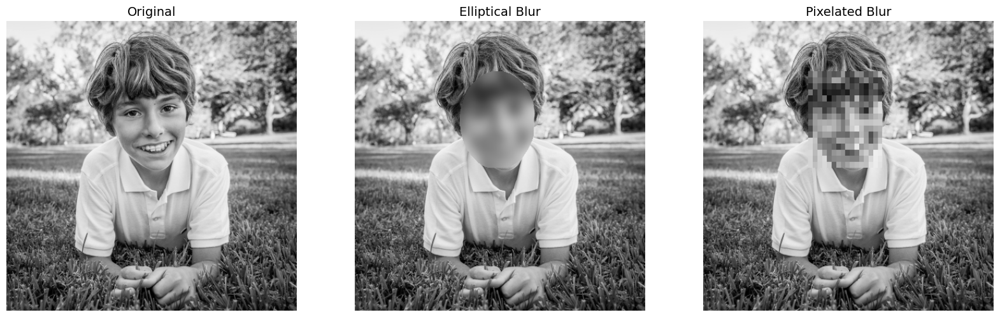

In [ ]:
img1_pixel = face_blur_pixelate(img1, net, pixels=16)

fig = plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.axis('off'); plt.imshow(img1[:,:,::-1]);         plt.title('Original')
plt.subplot(1,3,2); plt.axis('off'); plt.imshow(img1_ellipse[:,:,::-1]); plt.title('Elliptical Blur')
plt.subplot(1,3,3); plt.axis('off'); plt.imshow(img1_pixel[:,:,::-1]);   plt.title('Pixelated Blur');

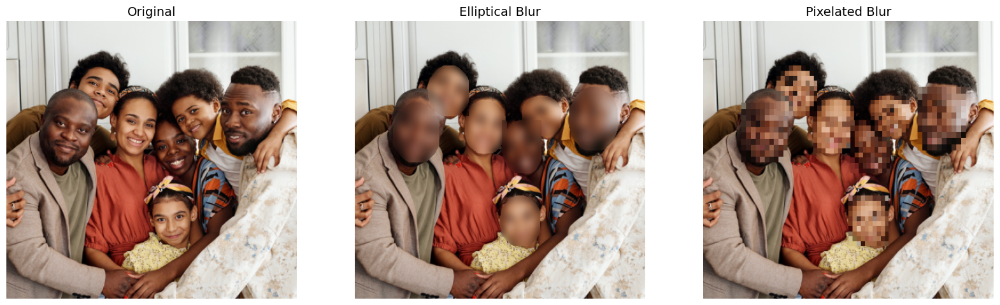

In [ ]:
img2_pixel = face_blur_pixelate(img2, net, pixels=10)

fig = plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.axis('off'); plt.imshow(img2[:,:,::-1]);         plt.title('Original')
plt.subplot(1,3,2); plt.axis('off'); plt.imshow(img2_ellipse[:,:,::-1]); plt.title('Elliptical Blur')
plt.subplot(1,3,3); plt.axis('off'); plt.imshow(img2_pixel[:,:,::-1]);   plt.title('Pixelated Blur');

In [ ]:
def face_blur_ellipse_pixelate(image, net, detect_threshold=0.9, factor=3, pixels=10, write_mask=False):

    img = image.copy()
    img_out = img.copy()
    elliptical_mask = np.zeros(img.shape, dtype=img.dtype)

    # Prepare image and perform inference.
    blob = cv2.dnn.blobFromImage(img, scalefactor=1.0, size=(300,300), mean=[104, 117, 123])
    net.setInput(blob)
    detections = net.forward()

    h, w = img.shape[:2]
    for i in range(detections.shape[2]):
        confidence = detections[0, 0, i, 2]
        if confidence > detect_threshold:

            # Extract the bounding box coordinates from the detection.
            box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
            (x1, y1, x2, y2) = box

            # The face is defined by the bounding rectangle from the detection.
            face = img[int(y1):int(y2), int(x1):int(x2), :]

            # Blur the rectangular area defined by the bounding box.
            face = blur(face, factor=factor)

            # Pixelate the blurred face.
            face = pixelate(face, pixels=pixels)

            # Copy the blurred/pixelated face to the output image.
            img_out[int(y1):int(y2), int(x1):int(x2), :] = face

            # Specify the elliptical parameters directly from the bounding box coordinates.
            e_center = (x1 + (x2 - x1)/2, y1 + (y2 - y1)/2)
            e_size   = (x2 - x1, y2 - y1)
            e_angle  = 0.0

            # Create an elliptical mask.
            elliptical_mask = cv2.ellipse(elliptical_mask, (e_center, e_size, e_angle),
                                                      (255, 255, 255), -1, cv2.LINE_AA)
            # Apply the elliptical mask.
            np.putmask(img, elliptical_mask, img_out)

    if write_mask:
        cv2.imwrite('elliptical_mask.jpg', elliptical_mask)

    return img

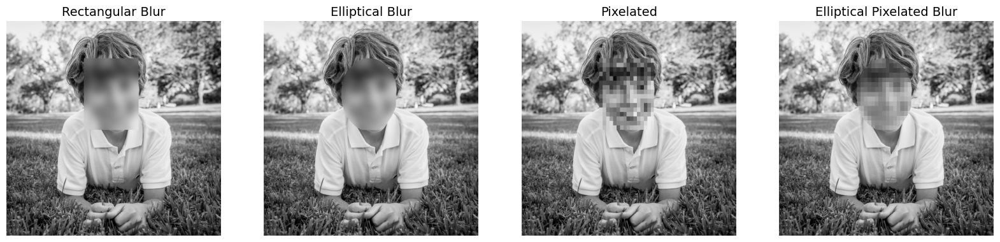

In [ ]:
img1_epb = face_blur_ellipse_pixelate(img1, net, factor=3.5, pixels=15)

fig = plt.figure(figsize=(20,10))
plt.subplot(1,4,1); plt.axis('off'); plt.imshow(img1_rect[:,:,::-1]);    plt.title('Rectangular Blur')
plt.subplot(1,4,2); plt.axis('off'); plt.imshow(img1_ellipse[:,:,::-1]); plt.title('Elliptical Blur')
plt.subplot(1,4,3); plt.axis('off'); plt.imshow(img1_pixel[:,:,::-1]);   plt.title('Pixelated')
plt.subplot(1,4,4); plt.axis('off'); plt.imshow(img1_epb[:,:,::-1]);     plt.title('Elliptical Pixelated Blur');

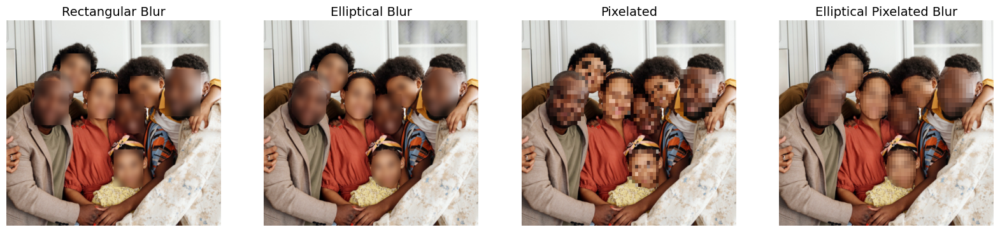

In [ ]:
img2_epb = face_blur_ellipse_pixelate(img2, net, factor=2, pixels=10)

fig = plt.figure(figsize=(20,10))
plt.subplot(1,4,1); plt.axis('off'); plt.imshow(img2_rect[:,:,::-1]);    plt.title('Rectangular Blur')
plt.subplot(1,4,2); plt.axis('off'); plt.imshow(img2_ellipse[:,:,::-1]); plt.title('Elliptical Blur')
plt.subplot(1,4,3); plt.axis('off'); plt.imshow(img2_pixel[:,:,::-1]);   plt.title('Pixelated')
plt.subplot(1,4,4); plt.axis('off'); plt.imshow(img2_epb[:,:,::-1]);     plt.title('Elliptical Pixelated Blur');

# Part 3: Mapping the Face

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (10,8)
matplotlib.rcParams['image.cmap'] = 'gray'

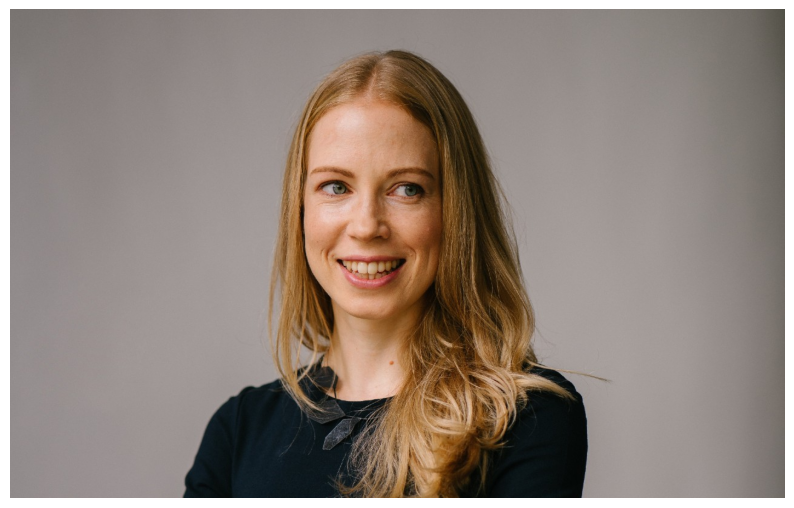

In [ ]:
image_filename = '/content/cv2/Mod14/face.jpg'
img = cv2.imread(image_filename)
plt.imshow(img[:,:,::-1]); plt.axis('off');

In [ ]:
# A smaller version of the model (FP16) is also provided.
# MODEL_PATH = './model/res10_300x300_ssd_iter_140000_fp16.caffemodel'

MODEL_PATH = '/content/cv2/Mod14/model/res10_300x300_ssd_iter_140000_fp16.caffemodel'
CONFIG_PATH = '/content/cv2/Mod14/model/deploy.prototxt'

# Load the face detection model.
net = cv2.dnn.readNetFromCaffe(CONFIG_PATH, MODEL_PATH)

In [ ]:
def detect_faces(image, detection_threshold=0.70):

    # Convert to blob.
    blob = cv2.dnn.blobFromImage(image, 1.0, (300, 300), [104, 117, 123])

    # Pass the blob to the DNN model.
    net.setInput(blob)

    # Retrieve detections from the DNN model.
    detections = net.forward()

    # Create a list to store face bounding boxes.
    faces = []

    img_h = image.shape[0]
    img_w = image.shape[1]

    # Process the detections.
    for detection in detections[0][0]:
        if detection[2] >= detection_threshold:
            left   = detection[3] * img_w
            top    = detection[4] * img_h
            right  = detection[5] * img_w
            bottom = detection[6] * img_h

            face_w = right - left
            face_h = bottom - top

            face_roi = (left, top, face_w, face_h)
            faces.append(face_roi)

    return np.array(faces).astype(int)

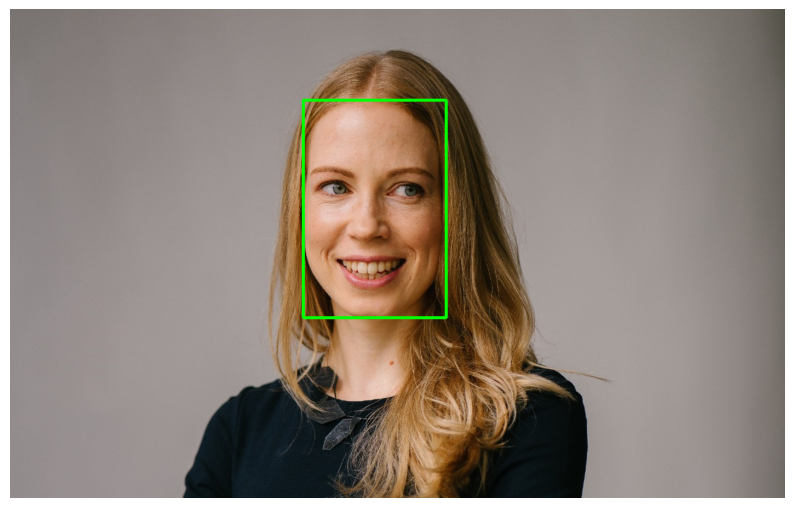

In [ ]:
faces = detect_faces(img)

img_display = img.copy()

for face in faces:
    cv2.rectangle(img_display, face, (0,255,0), 3)

plt.imshow(img_display[...,::-1]); plt.axis('off');

In [ ]:
# Create the landmark detector instance.
landmarkDetector = cv2.face.createFacemarkLBF()

# Load the model.
model = '/content/cv2/Mod14/model/lbfmodel.yaml'
landmarkDetector.loadModel(model)

In [ ]:
# Detect Landmarks.
retval, landmarksList = landmarkDetector.fit(img, faces)

In [ ]:
# First index in the list, "landmarksList[:]" refers to a specific array in the list.
print(landmarksList[0].shape)
print('')
print('                          x   y ')
print('                         -------')

print('First Landmark in list: ', landmarksList[0][0][0][0].astype(int),  landmarksList[0][0][0][1].astype(int))
print(' Last Landmark in list: ', landmarksList[0][0][67][0].astype(int), landmarksList[0][0][67][1].astype(int))
print('')
print(landmarksList)

(1, 68, 2)

                          x   y 
                         -------
First Landmark in list:  484 295
 Last Landmark in list:  580 441

(array([[[484.81717, 295.6733 ],
        [485.64407, 333.138  ],
        [486.402  , 368.97125],
        [490.29672, 406.0961 ],
        [500.51413, 442.40375],
        [519.5716 , 471.5253 ],
        [544.0725 , 492.36945],
        [571.0527 , 512.9028 ],
        [597.6244 , 518.2201 ],
        [624.0103 , 513.9856 ],
        [650.73895, 497.72464],
        [676.8282 , 479.98532],
        [697.56683, 451.53552],
        [708.52936, 415.14694],
        [711.6525 , 375.1353 ],
        [713.6867 , 334.89685],
        [715.76324, 295.61026],
        [495.32742, 272.84384],
        [512.3979 , 258.35352],
        [532.75116, 257.57565],
        [553.6708 , 263.44623],
        [574.39453, 275.10532],
        [610.93054, 278.84668],
        [633.1742 , 266.61252],
        [657.4868 , 260.4091 ],
        [681.89355, 264.69586],
        [700.45526, 28

68


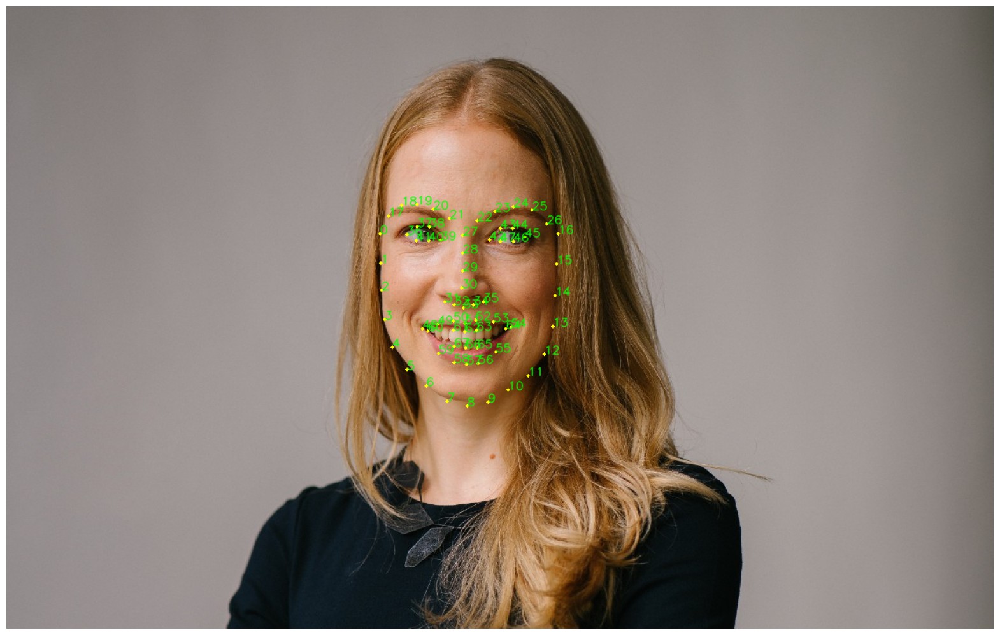

In [ ]:
img_display = img.copy()
landmarks = landmarksList[0][0].astype(int)
print(len(landmarks))
for idx in range(len(landmarks)):
    cv2.circle(img_display, landmarks[idx], 2, (0,255,255), -1)
    cv2.putText(img_display, "{}".format(idx), landmarks[idx], cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1,
                cv2.LINE_AA)
plt.figure(figsize=(20,20))
plt.imshow(img_display[:,:,::-1]); plt.axis('off');

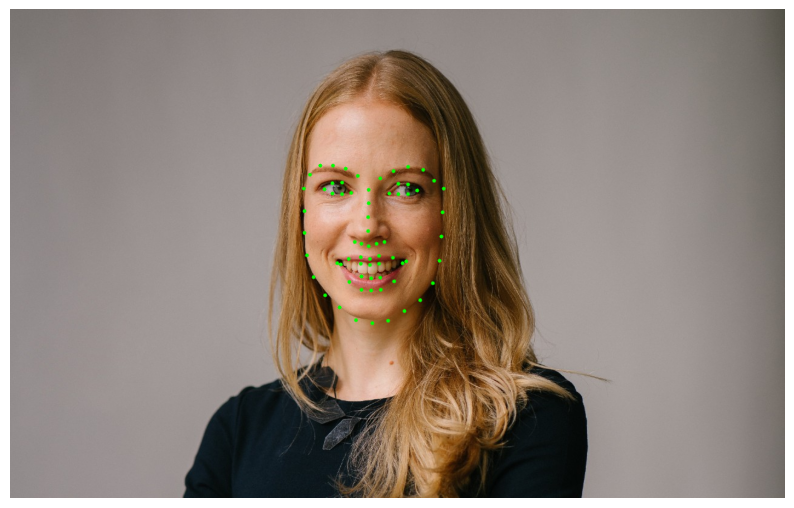

In [ ]:
img_display = img.copy()
for landmarks in landmarksList:
    cv2.face.drawFacemarks(img_display, landmarks, (0, 255, 0))

plt.imshow(img_display[...,::-1]); plt.axis('off');

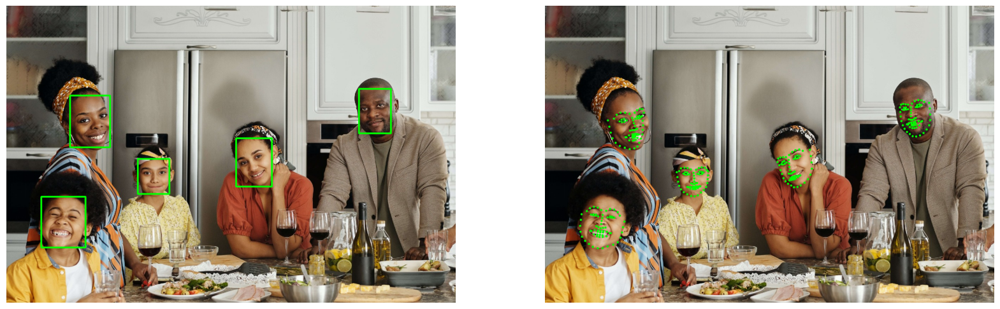

In [ ]:
image_filename = '/content/cv2/Mod14/family.jpg'
img = cv2.imread(image_filename)
img_display_faces = img.copy()
img_display_marks = img.copy()

# Detect the faces.
faces = detect_faces(img)

if len(faces) > 0:

    # Render bounding boxes.
    for face in faces:
        cv2.rectangle(img_display_faces, face, (0,255,0), 3)

    # Detect the facial landmarks.
    retval, landmarksList = landmarkDetector.fit(img, faces)

    # Render landmark points.
    for landmarks in landmarksList:
        cv2.face.drawFacemarks(img_display_marks, landmarks, (0, 255, 0))

    fig = plt.figure(figsize=(20,10))
    plt.subplot(121); plt.imshow(img_display_faces[...,::-1]); plt.axis('off');
    plt.subplot(122); plt.imshow(img_display_marks[...,::-1]); plt.axis('off');
else:
    print('No faces detected in image.')